<a href="https://colab.research.google.com/github/vs1991/Capstone-Project-Mahindra-First-Choice-Services-/blob/master/Capstone_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !pip install plotly --upgrade
# import plotly
# plotly.__version__
from google.colab import drive

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
drive.mount('../Greyatom',force_remount=True)

Mounted at ../Greyatom


In [ ]:
import os

In [ ]:
cd ../Greyatom/'My Drive'/Greyatom/'Mahindra First Choice Dataset'/

/Greyatom/My Drive/Greyatom/Mahindra First Choice Dataset


In [ ]:
ls

 Customer_Data.xlsx   JTD.csv          Masterfile.csv
 Final_invoice.csv    masterfile.csv  'Plant Master.xlsx'


In [ ]:
invoice_customer_plant_jtd= pd.read_csv('masterfile.csv')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,16) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
invoice_customer_plant_jtd.head()

,Cust Type,Customer No.,State,Invoice Date,Job Card No,JobCard Date,KMs Reading,Labour Total,Make,Misc Total,ODN No.,OSL Total,Order Type,Parts Total,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Data Origin,Title,ServiceTime_category,Description,Item Category,Order Quantity,Net value
0,Retail,67849,Maharashtra,2015-01-02,168303,2014-12-13,2,1203.14,GENERAL MOTORS,0.0,7.005200e+09,500.06,Paid Service,2348.75,0.0,KA19MA1291,RUPESH,4051.95,4051.95,1,1.0,Z007,2.0,super_slow,"REPLACE RR WHEEL BEARING (ONE), Engine Flush, ...","P002, P010, P001",80.500,4051.95
1,Retail,67849,Maharashtra,2014-08-14,136482,2014-08-08,2,989.98,GENERAL MOTORS,0.0,7.000137e+09,6249.87,Accidental,4230.25,0.0,KA19MA1291,AMARNATH,11470.10,11470.10,8,1.0,Z007,2.0,super_slow,"REINF A-BUMPER RR LH, FASCIA-BUMPER FRONT, REM...","P002, P010, P001",2008.000,11470.10
2,Retail,67849,Maharashtra,2014-08-16,135895,2014-08-06,2,6473.05,GENERAL MOTORS,0.0,7.000137e+09,7325.09,Paid Service,14546.14,0.0,KA19MA1291,RUPESH,28344.28,28344.28,8,1.0,Z007,2.0,super_slow,"FRONT STRUTS KITS, BULB 1016(12V,21/5W), DAMPE...","P002, P010, P001",479.500,28344.28
3,Retail,67849,Maharashtra,2014-10-09,150383,2014-10-06,2,0.00,GENERAL MOTORS,0.0,7.000151e+09,0.00,Running Repairs,200.00,0.0,KA19MA1291,HARSHAD,200.00,200.00,10,1.0,Z007,2.0,slow,PROFAR CONCENTRATED ANTIFREEZE COOLANT,P002,1.000,200.00
4,Retail,67849,Maharashtra,2014-12-31,168210,2014-12-13,2,1760.02,GENERAL MOTORS,500.0,7.000175e+09,7850.09,Accidental,20348.81,0.0,KA19MA1291,Amarnath,30458.92,30458.92,12,1.0,Z007,2.0,super_slow,"FEVIQUIK 3 GM, TIE CLIP, PAINTING CHARGES, AUT...","P002, P010, P011, P001",1046.214,30458.92


In [ ]:
invoice_customer_plant_jtd.isnull().sum()

Cust Type                    0
Customer No.                 0
State                        0
Invoice Date                 0
Job Card No                  0
JobCard Date                 0
KMs Reading                  0
Labour Total                 0
Make                         0
Misc Total                   0
ODN No.                 197244
OSL Total                    0
Order Type                   0
Parts Total                  0
Recovrbl Exp                 0
Regn No                     16
Technician Name         236792
Total Amt Wtd Tax.           0
Total Value             197244
Invoice month                0
Partner Type                 0
Data Origin                  0
Title                        0
ServiceTime_category         0
Description              16693
Item Category                0
Order Quantity               0
Net value                    0
dtype: int64

In [ ]:
invoice_customer_plant_jtd.dropna(inplace=True)

# Label Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
le = LabelEncoder()

In [ ]:
invoice_customer_plant_jtd_categroical = invoice_customer_plant_jtd[['Cust Type', 'Order Type', "Make", "State", 'ServiceTime_category',"Data Origin"]]

In [ ]:
invoice_customer_plant_jtd_categroical.head()

,Cust Type,Order Type,Make,State,ServiceTime_category,Data Origin
0,Retail,Paid Service,GENERAL MOTORS,Maharashtra,super_slow,Z007
1,Retail,Accidental,GENERAL MOTORS,Maharashtra,super_slow,Z007
2,Retail,Paid Service,GENERAL MOTORS,Maharashtra,super_slow,Z007
3,Retail,Running Repairs,GENERAL MOTORS,Maharashtra,slow,Z007
4,Retail,Accidental,GENERAL MOTORS,Maharashtra,super_slow,Z007


In [ ]:
invoice_encoded = invoice_customer_plant_jtd_categroical.apply(le.fit_transform)

In [ ]:
import numpy as np

In [ ]:
invoice_numerical = invoice_customer_plant_jtd.select_dtypes(include=[np.number])

In [ ]:
invoice_numerical.head()

,Job Card No,KMs Reading,Labour Total,Misc Total,ODN No.,OSL Total,Parts Total,Recovrbl Exp,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Net value
0,168303,2,1203.14,0.0,7.005200e+09,500.06,2348.75,0.0,4051.95,4051.95,1,1.0,2.0,80.500,4051.95
1,136482,2,989.98,0.0,7.000137e+09,6249.87,4230.25,0.0,11470.10,11470.10,8,1.0,2.0,2008.000,11470.10
2,135895,2,6473.05,0.0,7.000137e+09,7325.09,14546.14,0.0,28344.28,28344.28,8,1.0,2.0,479.500,28344.28
3,150383,2,0.00,0.0,7.000151e+09,0.00,200.00,0.0,200.00,200.00,10,1.0,2.0,1.000,200.00
4,168210,2,1760.02,500.0,7.000175e+09,7850.09,20348.81,0.0,30458.92,30458.92,12,1.0,2.0,1046.214,30458.92


In [ ]:
cluster_data = pd.concat([invoice_encoded,invoice_numerical], axis=1)

In [ ]:
cluster_data.head()

,Cust Type,Order Type,Make,State,ServiceTime_category,Data Origin,Job Card No,KMs Reading,Labour Total,Misc Total,ODN No.,OSL Total,Parts Total,Recovrbl Exp,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Net value
0,5,1,6,20,4,6,168303,2,1203.14,0.0,7.005200e+09,500.06,2348.75,0.0,4051.95,4051.95,1,1.0,2.0,80.500,4051.95
1,5,0,6,20,4,6,136482,2,989.98,0.0,7.000137e+09,6249.87,4230.25,0.0,11470.10,11470.10,8,1.0,2.0,2008.000,11470.10
2,5,1,6,20,4,6,135895,2,6473.05,0.0,7.000137e+09,7325.09,14546.14,0.0,28344.28,28344.28,8,1.0,2.0,479.500,28344.28
3,5,3,6,20,2,6,150383,2,0.00,0.0,7.000151e+09,0.00,200.00,0.0,200.00,200.00,10,1.0,2.0,1.000,200.00
4,5,0,6,20,4,6,168210,2,1760.02,500.0,7.000175e+09,7850.09,20348.81,0.0,30458.92,30458.92,12,1.0,2.0,1046.214,30458.92


# Cluster Analysis

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
dist=[]
# Iterate from 1-9
for i in range(1, 10):
    # Initialize KMeans algorithm
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=300, random_state=0)
    # Fit on data
    km.fit(cluster_data)
    # Append Within-Cluster-Sum-of-Squares (WCSS) to list storing WCSS
    dist.append(km.inertia_)

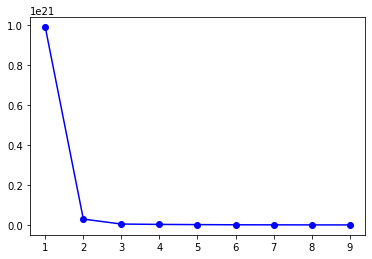

In [ ]:
# Line plot # clusters on X-axis and WCSS on Y-axis 
plt.plot(range(1, 10), dist, 'bo-')
plt.show()

In [ ]:
cluster  = KMeans(n_clusters=5, init='k-means++', max_iter=300, n_init=10, random_state=0)
# create 'cluster' column
cluster_data['cluster'] = cluster.fit_predict(cluster_data)

In [ ]:
cluster_data['cluster'].value_counts()

2    132631
1     41010
3     34616
0     26221
4     14333
Name: cluster, dtype: int64

# Visualize clusters using PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
# initialize pca object with 2 components
pca = PCA(n_components=2,random_state=0)

# create 'x' and 'y' columns donoting observation locations in decomposed form
cluster_data["x"] = pca.fit_transform(cluster_data[cluster_data.columns])[:,0]
cluster_data["y"] = pca.fit_transform(cluster_data[cluster_data.columns])[:,1]

In [ ]:
pca.fit_transform(cluster_data[cluster_data.columns])[:,1]

array([ 40231.1472787 ,   1108.35437577,    932.70571633, ...,
       -89294.86839521, -83972.4403328 , -84476.84517333])

Text(0.5, 1.0, 'Visualize clusters using PCA')

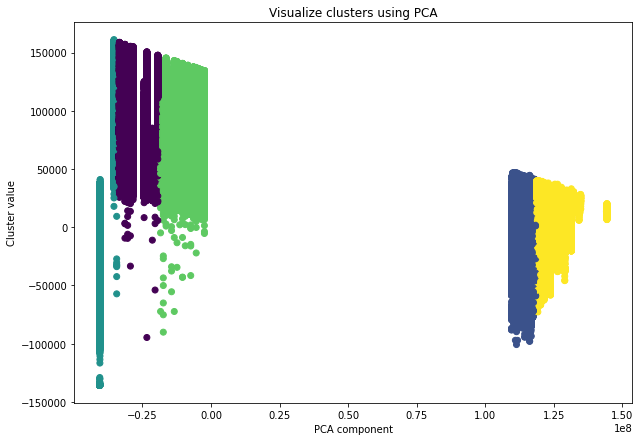

In [ ]:

plt.figure(figsize=(10, 7))
plt.scatter(x=cluster_data["x"],y=cluster_data["y"],c=cluster.labels_)
plt.xlabel('PCA component')
plt.ylabel('Cluster value')
plt.title('Visualize clusters using PCA')


In [ ]:
import plotly.express as px
fig = px.scatter(cluster_data, x="x", y="y", color='cluster')
fig.update_layout(
    title="Visualize clusters using PCA",
    xaxis_title="PCA Compoement",
    yaxis_title="Clustering value")
fig.show()

In [ ]:
cluster_data.head(0)

,Cust Type,Order Type,Make,State,ServiceTime_category,Data Origin,Job Card No,KMs Reading,Labour Total,Misc Total,ODN No.,OSL Total,Parts Total,Recovrbl Exp,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Net value,cluster,x,y


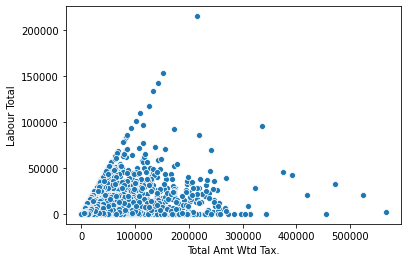

In [ ]:
sns.scatterplot(cluster_data['Total Amt Wtd Tax.'],cluster_data["Labour Total"])

In [ ]:
import plotly.express as px
fig = px.scatter(cluster_data, x="Total Amt Wtd Tax.", y="Labour Total", color='cluster')
fig.update_layout(
    title="Visualize clusters using PCA",
    xaxis_title="PCA Compoement",
    yaxis_title="Clustering value")
fig.show()

In [ ]:
clust_group=cluster_data.groupby( ['cluster','State','Make'])['Total Amt Wtd Tax.'].sum()

In [ ]:
clust_group

cluster  State  Make
0        1      0           348.87
                2         25644.85
                3        234643.40
                5       1352676.77
                6        883205.13
                           ...    
4        33     13        59762.65
                22          601.67
                24         3498.50
                25         2620.13
                26         1321.30
Name: Total Amt Wtd Tax., Length: 1148, dtype: float64

In [ ]:
cluster_data["cluster"].value_counts()

2    132631
1     41010
3     34616
0     26221
4     14333
Name: cluster, dtype: int64

In [ ]:
invoice_customer_plant_jtd["clusters"] = cluster_data["cluster"]

In [ ]:
invoice_customer_plant_jtd.head()

,Cust Type,Customer No.,State,Invoice Date,Job Card No,JobCard Date,KMs Reading,Labour Total,Make,Misc Total,ODN No.,OSL Total,Order Type,Parts Total,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Data Origin,Title,ServiceTime_category,Description,Item Category,Order Quantity,Net value,clusters
0,Retail,67849,Maharashtra,2015-01-02,168303,2014-12-13,2,1203.14,GENERAL MOTORS,0.0,7.005200e+09,500.06,Paid Service,2348.75,0.0,KA19MA1291,RUPESH,4051.95,4051.95,1,1.0,Z007,2.0,super_slow,"REPLACE RR WHEEL BEARING (ONE), Engine Flush, ...","P002, P010, P001",80.500,4051.95,2
1,Retail,67849,Maharashtra,2014-08-14,136482,2014-08-08,2,989.98,GENERAL MOTORS,0.0,7.000137e+09,6249.87,Accidental,4230.25,0.0,KA19MA1291,AMARNATH,11470.10,11470.10,8,1.0,Z007,2.0,super_slow,"REINF A-BUMPER RR LH, FASCIA-BUMPER FRONT, REM...","P002, P010, P001",2008.000,11470.10,2
2,Retail,67849,Maharashtra,2014-08-16,135895,2014-08-06,2,6473.05,GENERAL MOTORS,0.0,7.000137e+09,7325.09,Paid Service,14546.14,0.0,KA19MA1291,RUPESH,28344.28,28344.28,8,1.0,Z007,2.0,super_slow,"FRONT STRUTS KITS, BULB 1016(12V,21/5W), DAMPE...","P002, P010, P001",479.500,28344.28,2
3,Retail,67849,Maharashtra,2014-10-09,150383,2014-10-06,2,0.00,GENERAL MOTORS,0.0,7.000151e+09,0.00,Running Repairs,200.00,0.0,KA19MA1291,HARSHAD,200.00,200.00,10,1.0,Z007,2.0,slow,PROFAR CONCENTRATED ANTIFREEZE COOLANT,P002,1.000,200.00,2
4,Retail,67849,Maharashtra,2014-12-31,168210,2014-12-13,2,1760.02,GENERAL MOTORS,500.0,7.000175e+09,7850.09,Accidental,20348.81,0.0,KA19MA1291,Amarnath,30458.92,30458.92,12,1.0,Z007,2.0,super_slow,"FEVIQUIK 3 GM, TIE CLIP, PAINTING CHARGES, AUT...","P002, P010, P011, P001",1046.214,30458.92,2


# Number of retail cutomers in all **clusters**

In [ ]:

retail = {}
for i in invoice_customer_plant_jtd["clusters"].unique():
    
    new_df = invoice_customer_plant_jtd[["clusters","Cust Type"]]
    
    counts = invoice_customer_plant_jtd[["clusters","Cust Type"]]["Cust Type"].value_counts(ascending=False)
    
    if counts.index[0]=="Retail":
        
        retail[i]=counts[i]

In [ ]:
retail

{0: 247711, 1: 478, 2: 445, 3: 136, 4: 40}

Text(0.5, 1.0, 'Revenue per month analysis')

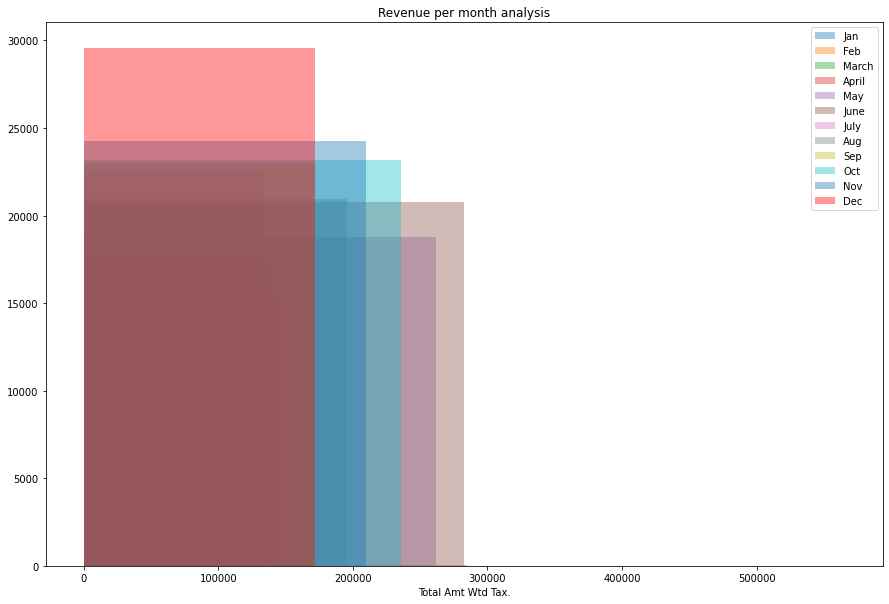

In [ ]:

fig, axes = plt.subplots(figsize=(15, 10))

ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==1]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Jan", ax = axes,kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==2]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Feb", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==3]["Total Amt Wtd Tax."].dropna(), bins=2, label = "March", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==4]["Total Amt Wtd Tax."].dropna(), bins=2, label = "April", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==5]["Total Amt Wtd Tax."].dropna(), bins=2, label = "May", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==6]["Total Amt Wtd Tax."].dropna(), bins=2, label = "June", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==7]["Total Amt Wtd Tax."].dropna(), bins=2, label = "July", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==8]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Aug", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==9]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Sep", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==10]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Oct", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==11]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Nov", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd['Invoice month']==12]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Dec", ax = axes,color="Red", kde =False)
ax.legend()
ax.set_title('Revenue per month analysis')

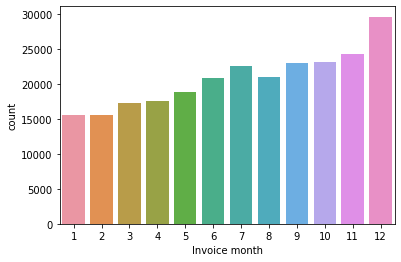

In [ ]:
sns.countplot(invoice_customer_plant_jtd["Invoice month"])

In [ ]:
invoice_customer_plant_jtd["State"].value_counts()

Maharashtra             72413
Tamil Nadu              55571
Andhra Pradesh          25123
Uttar Pradesh           21953
Karnataka               16471
Gujarat                 14747
Punjab                  14227
Haryana                 11108
Delhi                    4282
Kerala                   3831
Telangana                2758
Chandigarh               1951
Madhya Pradesh           1251
Puducherry                839
Dadra and Nagar Hav.      695
Himachal Pradesh          548
Daman and Diu             333
Chhattisgarh              259
Rajasthan                 253
Uttarakhand                76
Arunachal Pradesh          40
Goa                        15
West Bengal                11
Jammu and Kashmir          11
Nagaland                    8
Lakshadweep                 7
Jharkhand                   6
Bihar                       6
Megalaya                    5
Andaman and Nico.In.        4
Tripura                     3
Sikkim                      2
Odisha                      2
Assam     

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning:

invalid value encountered in double_scalars



Text(0.5, 1.0, 'Geo locaton based Revenue Analysis')

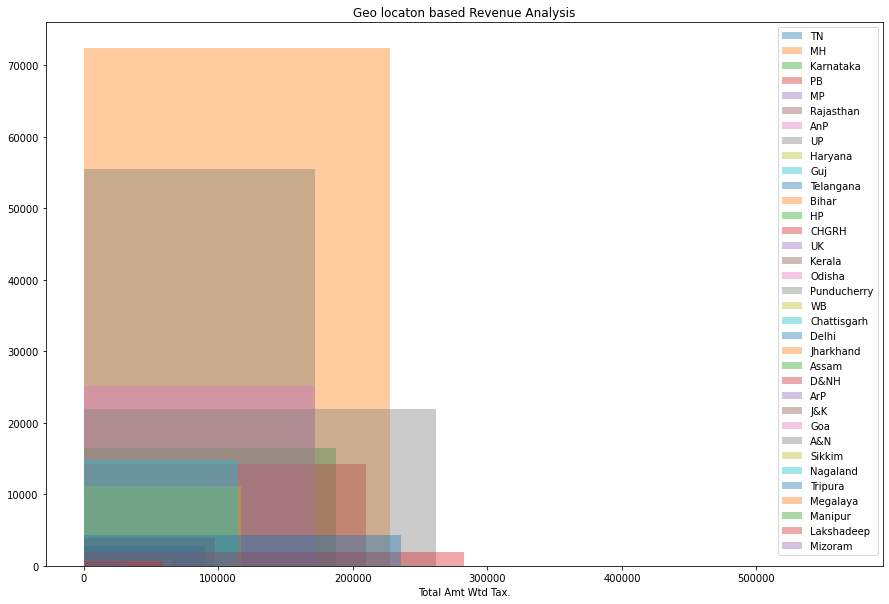

In [ ]:
fig, axes = plt.subplots(figsize=(15, 10))

ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Tamil Nadu"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "TN", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Maharashtra"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MH", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Karnataka"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Karnataka", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Punjab"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "PB", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Madhya Pradesh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Rajasthan"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Rajasthan", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Andhra Pradesh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "AnP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Uttar Pradesh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "UP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Haryana"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Haryana", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Gujarat"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Guj", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Telangana"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Telangana", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Bihar"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Bihar", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Himachal Pradesh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "HP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Chandigarh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "CHGRH", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Uttarakhand"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "UK", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Kerala"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Kerala", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Odisha"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Odisha", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Puducherry"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Punducherry", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="West Bengal"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "WB", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Chhattisgarh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Chattisgarh", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Delhi"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Delhi", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Jharkhand"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Jharkhand", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Assam"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Assam", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Dadra and Nagar Hav."]["Total Amt Wtd Tax."].dropna(), bins=2, label = "D&NH", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Arunachal Pradesh"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "ArP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Jammu and Kashmir"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "J&K", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Goa"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Goa", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Andaman and Nico.In."]["Total Amt Wtd Tax."].dropna(), bins=2, label = "A&N", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Sikkim"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Sikkim", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Nagaland"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Nagaland", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Tripura"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Tripura", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Megalaya"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Megalaya", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Manipur"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Manipur", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Lakshadweep"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Lakshadeep", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["State"]=="Mizoram"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "Mizoram", ax = axes, kde =False)

ax.legend()
ax.set_title('Geo locaton based Revenue Analysis')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34]), <a list of 35 Text major ticklabel objects>)

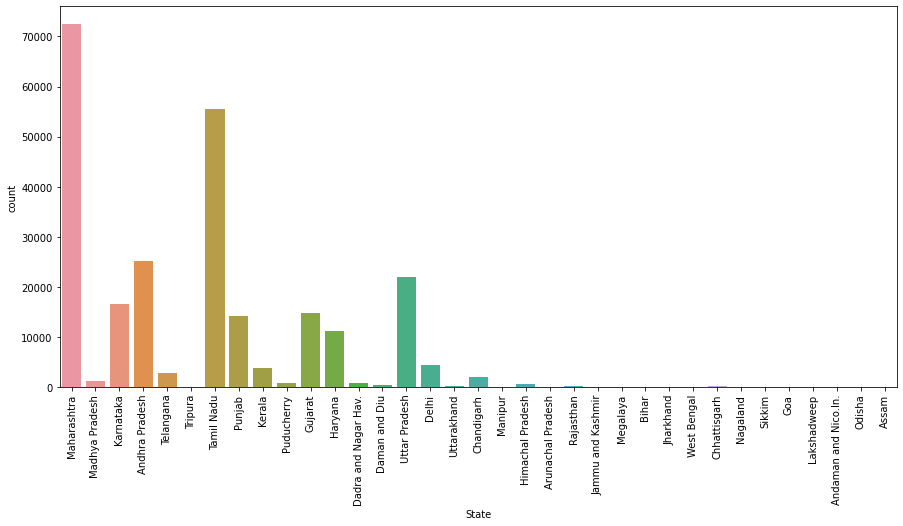

In [ ]:
plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_plant_jtd["State"])
plt.xticks(rotation = 90)


In [ ]:
invoice_customer_plant_jtd["State"].value_counts()

Maharashtra             72413
Tamil Nadu              55571
Andhra Pradesh          25123
Uttar Pradesh           21953
Karnataka               16471
Gujarat                 14747
Punjab                  14227
Haryana                 11108
Delhi                    4282
Kerala                   3831
Telangana                2758
Chandigarh               1951
Madhya Pradesh           1251
Puducherry                839
Dadra and Nagar Hav.      695
Himachal Pradesh          548
Daman and Diu             333
Chhattisgarh              259
Rajasthan                 253
Uttarakhand                76
Arunachal Pradesh          40
Goa                        15
West Bengal                11
Jammu and Kashmir          11
Nagaland                    8
Lakshadweep                 7
Jharkhand                   6
Bihar                       6
Megalaya                    5
Andaman and Nico.In.        4
Tripura                     3
Sikkim                      2
Odisha                      2
Assam     

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34]), <a list of 35 Text major ticklabel objects>)

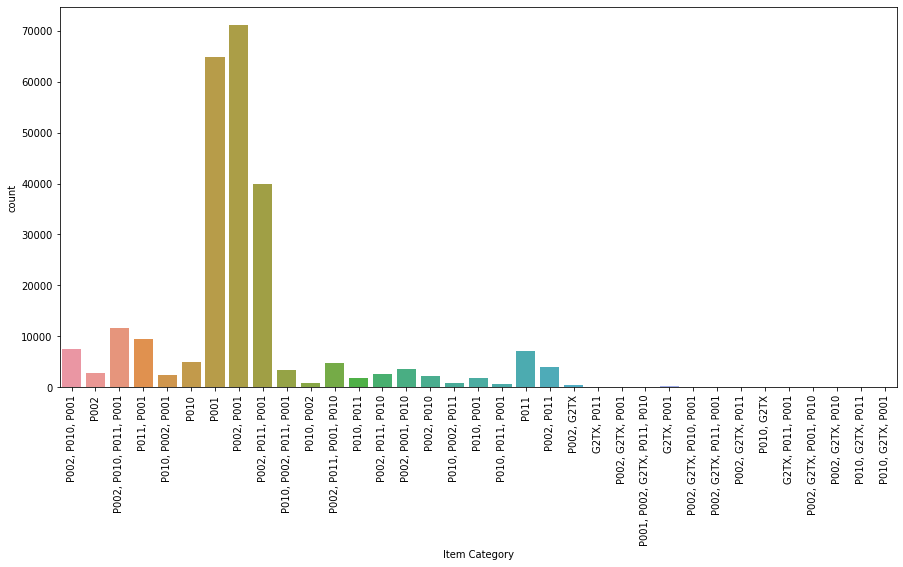

In [ ]:

plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_plant_jtd["Item Category"])
plt.xticks(rotation = 90)

In [ ]:
invoice_customer_plant_jtd["Item Category"].value_counts(),invoice_customer_plant_jtd["Description"].value_counts()

(P002, P001                      71194
 P001                            64851
 P002, P011, P001                39827
 P002, P010, P011, P001          11612
 P011, P001                       9435
 P002, P010, P001                 7415
 P011                             7178
 P010                             4944
 P002, P011, P001, P010           4718
 P002, P011                       4052
 P002, P001, P010                 3647
 P010, P002, P011, P001           3283
 P002                             2881
 P002, P011, P010                 2565
 P010, P002, P001                 2363
 P002, P010                       2225
 P010, P001                       1742
 P010, P011                       1730
 P010, P002, P011                  871
 P010, P002                        797
 P010, P011, P001                  640
 P002, G2TX                        416
 G2TX, P001                        160
 P002, G2TX, P001                  101
 G2TX, P011                         50
 P002, G2TX, P011, P001  

In [ ]:

invoice_customer_plant_jtd["Make"].value_counts()

MARUTI SUZUKI           74597
HYUNDAI                 46636
MAHINDRA &  MAHINDRA    42380
TATA MOTORS             29206
GENERAL MOTORS          15279
FORD                    10851
TOYOTA                   9171
HONDA                    8090
FIAT                     3185
SKODA                    3108
VOLKSWAGEN               2719
NISSAN                   1220
RENAULT                  1022
MITSUBISHI MOTORS         651
DAEWOO                    204
BMW                       103
MERCEDES BENZ              93
AUDI                       76
HINDUSTAN MOTORS           71
FORCE                      68
PREMIER AUTOMOBILES        35
SONALIKA                   25
VOLVO                       8
LAND ROVER                  7
JEEP                        2
PORCHE                      2
MORRIS                      1
SAN MOTORS                  1
Name: Make, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning:

invalid value encountered in double_scalars



Text(0.5, 1.0, 'Make of Cars based Revenue Analysis')

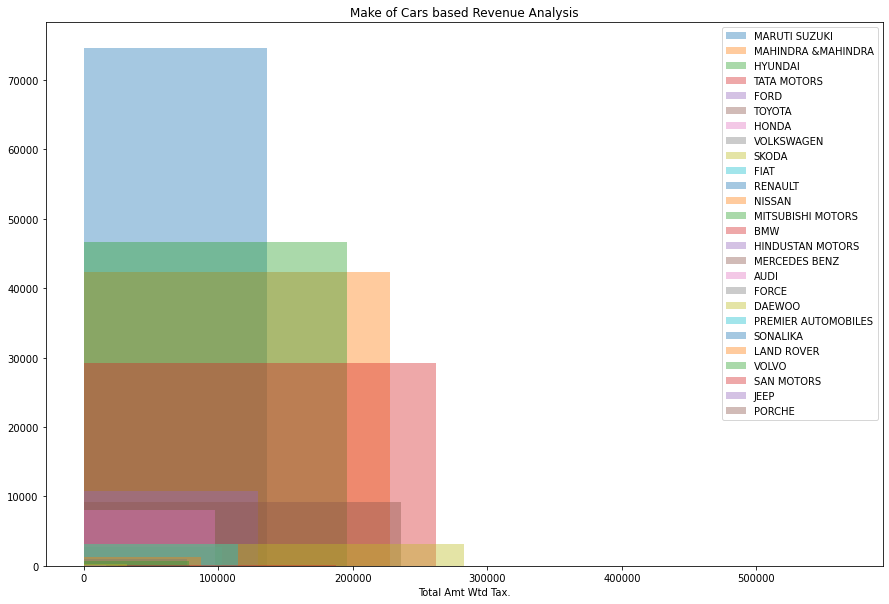

In [ ]:
fig, axes = plt.subplots(figsize=(15, 10))

ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="MARUTI SUZUKI"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MARUTI SUZUKI", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="MAHINDRA &  MAHINDRA"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MAHINDRA &MAHINDRA", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="HYUNDAI"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "HYUNDAI", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="TATA MOTORS"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "TATA MOTORS", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="FORD"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "FORD", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="TOYOTA"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "TOYOTA", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="HONDA"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "HONDA", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="VOLKSWAGEN"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "VOLKSWAGEN", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="SKODA"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "SKODA", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="FIAT"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "FIAT", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="RENAULT"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "RENAULT", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="NISSAN"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "NISSAN", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="MITSUBISHI MOTORS"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MITSUBISHI MOTORS", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="BMW"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "BMW", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="HINDUSTAN MOTORS"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "HINDUSTAN MOTORS", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="MERCEDES BENZ"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "MERCEDES BENZ", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="AUDI"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "AUDI", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="FORCE"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "FORCE", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="DAEWOO"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "DAEWOO", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="PREMIER AUTOMOBILES"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "PREMIER AUTOMOBILES", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="SONALIKA"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "SONALIKA", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="LAND ROVER"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "LAND ROVER", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="VOLVO"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "VOLVO", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="SAN MOTORS"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "SAN MOTORS", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="JEEP"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "JEEP", ax = axes, kde =False)
ax = sns.distplot(invoice_customer_plant_jtd[invoice_customer_plant_jtd["Make"]=="PORCHE"]["Total Amt Wtd Tax."].dropna(), bins=2, label = "PORCHE", ax = axes, kde =False)

ax.legend()
ax.set_title('Make of Cars based Revenue Analysis')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]),
 <a list of 28 Text major ticklabel objects>)

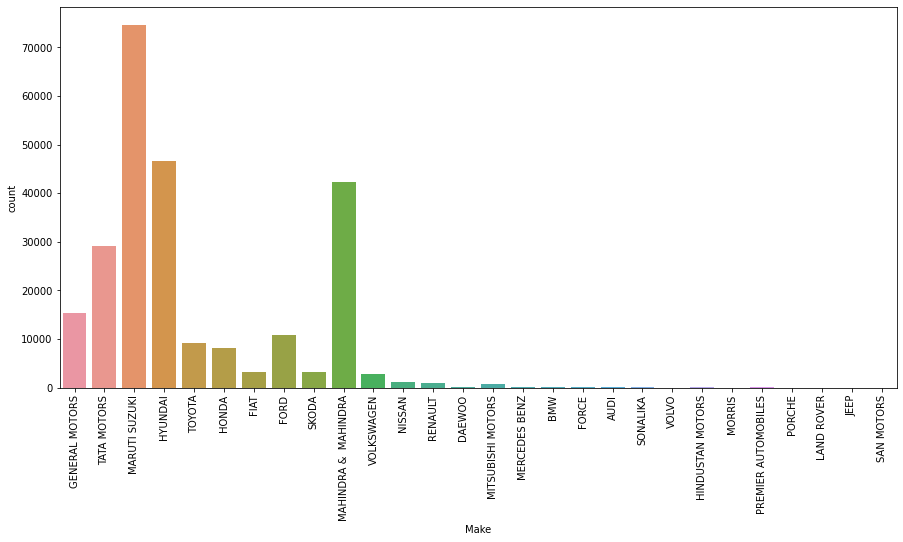

In [ ]:

plt.figure(figsize=(15,7))
sns.countplot(invoice_customer_plant_jtd["Make"])
plt.xticks(rotation = 90)

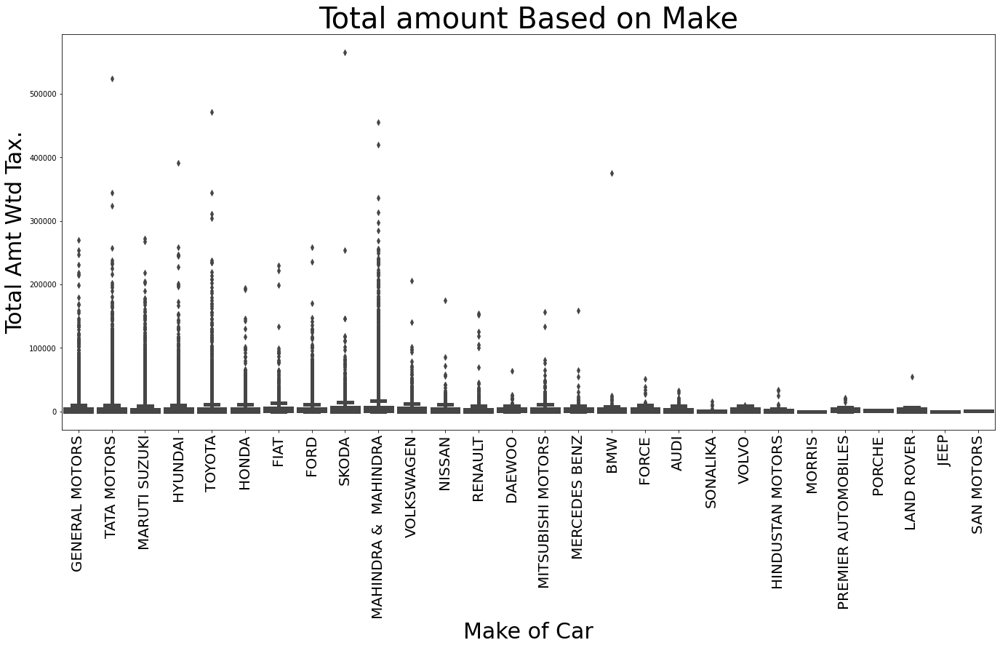

In [ ]:

plt.figure(figsize=(23,10))
ax = sns.boxplot(x="Make", y="Total Amt Wtd Tax.", data=invoice_customer_plant_jtd,width=0.8,linewidth=5)
ax.set_xlabel('Make of Car',fontsize=30)
ax.set_ylabel('Total Amt Wtd Tax.',fontsize=30)
plt.title('Total amount Based on Make',fontsize=40)
ax.tick_params(axis='x',labelsize=20,rotation=90)

In [ ]:
cluster_data.head()

,Cust Type,Order Type,Make,State,ServiceTime_category,Data Origin,Job Card No,KMs Reading,Labour Total,Misc Total,ODN No.,OSL Total,Parts Total,Recovrbl Exp,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Net value,cluster,x,y
0,5,1,6,20,4,6,168303,2,1203.14,0.0,7.005200e+09,500.06,2348.75,0.0,4051.95,4051.95,1,1.0,2.0,80.500,4051.95,2,-3.540026e+07,28447.717056
1,5,0,6,20,4,6,136482,2,989.98,0.0,7.000137e+09,6249.87,4230.25,0.0,11470.10,11470.10,8,1.0,2.0,2008.000,11470.10,2,-4.046292e+07,783.724895
2,5,1,6,20,4,6,135895,2,6473.05,0.0,7.000137e+09,7325.09,14546.14,0.0,28344.28,28344.28,8,1.0,2.0,479.500,28344.28,2,-4.046279e+07,659.522537
3,5,3,6,20,2,6,150383,2,0.00,0.0,7.000151e+09,0.00,200.00,0.0,200.00,200.00,10,1.0,2.0,1.000,200.00,2,-4.044916e+07,14346.943564
4,5,0,6,20,4,6,168210,2,1760.02,500.0,7.000175e+09,7850.09,20348.81,0.0,30458.92,30458.92,12,1.0,2.0,1046.214,30458.92,2,-4.042505e+07,33026.618957


In [ ]:
data = cluster_data.drop(["Labour Total","Misc Total","OSL Total","Parts Total","Net value","cluster","x","y","Job Card No","Total Amt Wtd Tax."],1)

In [ ]:
data["Revenue"] = cluster_data["Total Amt Wtd Tax."]

In [ ]:
data.head()

,Cust Type,Order Type,Make,State,ServiceTime_category,Data Origin,KMs Reading,ODN No.,Recovrbl Exp,Total Value,Invoice month,Partner Type,Title,Order Quantity,Revenue
0,5,1,6,20,4,6,2,7.005200e+09,0.0,4051.95,1,1.0,2.0,80.500,4051.95
1,5,0,6,20,4,6,2,7.000137e+09,0.0,11470.10,8,1.0,2.0,2008.000,11470.10
2,5,1,6,20,4,6,2,7.000137e+09,0.0,28344.28,8,1.0,2.0,479.500,28344.28
3,5,3,6,20,2,6,2,7.000151e+09,0.0,200.00,10,1.0,2.0,1.000,200.00
4,5,0,6,20,4,6,2,7.000175e+09,0.0,30458.92,12,1.0,2.0,1046.214,30458.92


In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scalar = MinMaxScaler()
df = scalar.fit_transform(data)
new_df = pd.DataFrame(df,columns=data.columns)

In [ ]:
pca = PCA(n_components=1,random_state=0)
x = pca.fit_transform(data[data.drop(["Revenue"],1).columns])
data["x"] = x

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:2264: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



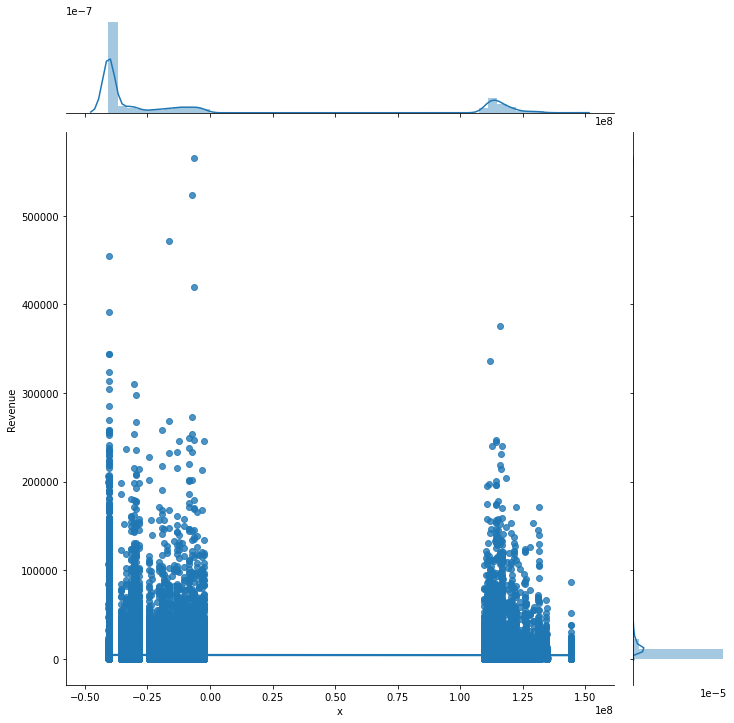

In [ ]:
sns.jointplot(x='x', y='Revenue', data=data, kind='reg', size=10)
#plt.title('Regression plot')
plt.show()

In [ ]:
invoice_customer_plant_jtd.head()

,Cust Type,Customer No.,State,Invoice Date,Job Card No,JobCard Date,KMs Reading,Labour Total,Make,Misc Total,ODN No.,OSL Total,Order Type,Parts Total,Recovrbl Exp,Regn No,Technician Name,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Data Origin,Title,ServiceTime_category,Description,Item Category,Order Quantity,Net value,clusters
0,Retail,67849,Maharashtra,2015-01-02,168303,2014-12-13,0,1203.14,GENERAL MOTORS,0.0,7.005200e+09,500.06,Paid Service,2348.75,0.0,KA19MA1291,RUPESH,4051.95,4051.95,1,1.0,Z007,2.0,super_slow,"OIL FILTER, REPLACE RR WHEEL BEARING (ONE), En...","P002, P001, P010",80.500,4051.95,2
1,Retail,67849,Maharashtra,2014-08-14,136482,2014-08-08,0,989.98,GENERAL MOTORS,0.0,7.000137e+09,6249.87,Accidental,4230.25,0.0,KA19MA1291,AMARNATH,11470.10,11470.10,8,1.0,Z007,2.0,super_slow,"LINER A-FENDER RH, REINF A-BUMPER RR LH, PAINT...","P002, P001, P010",2008.000,11470.10,2
2,Retail,67849,Maharashtra,2014-08-16,135895,2014-08-06,0,6473.05,GENERAL MOTORS,0.0,7.000137e+09,7325.09,Paid Service,14546.14,0.0,KA19MA1291,RUPESH,28344.28,28344.28,8,1.0,Z007,2.0,super_slow,"Engine Flush, BALANCE WEIGHT 15GRAM, BALANCE W...","P002, P001, P010",479.500,28344.28,2
3,Retail,67849,Maharashtra,2014-10-09,150383,2014-10-06,0,0.00,GENERAL MOTORS,0.0,7.000151e+09,0.00,Running Repairs,200.00,0.0,KA19MA1291,HARSHAD,200.00,200.00,10,1.0,Z007,2.0,slow,PROFAR CONCENTRATED ANTIFREEZE COOLANT,P002,1.000,200.00,2
4,Retail,67849,Maharashtra,2014-12-31,168210,2014-12-13,0,1760.02,GENERAL MOTORS,500.0,7.000175e+09,7850.09,Accidental,20348.81,0.0,KA19MA1291,Amarnath,30458.92,30458.92,12,1.0,Z007,2.0,super_slow,"AUTOBASE PLUS MM Q964R 1 LT (HSE), MISC_OTHER ...","P002, P011, P001, P010",1046.214,30458.92,2


In [ ]:
df = invoice_customer_plant_jtd.drop(["Customer No.","Job Card No","Labour Total","Misc Total","OSL Total",
                                      "Parts Total","Regn No","Data Origin","Description","Net value","clusters", 'Invoice Date','JobCard Date','Technician Name','ODN No.','Recovrbl Exp'],1)

In [ ]:
df.head()

,Cust Type,State,KMs Reading,Make,Order Type,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,ServiceTime_category,Item Category,Order Quantity
0,Retail,Maharashtra,0,GENERAL MOTORS,Paid Service,4051.95,4051.95,1,1.0,2.0,super_slow,"P002, P001, P010",80.500
1,Retail,Maharashtra,0,GENERAL MOTORS,Accidental,11470.10,11470.10,8,1.0,2.0,super_slow,"P002, P001, P010",2008.000
2,Retail,Maharashtra,0,GENERAL MOTORS,Paid Service,28344.28,28344.28,8,1.0,2.0,super_slow,"P002, P001, P010",479.500
3,Retail,Maharashtra,0,GENERAL MOTORS,Running Repairs,200.00,200.00,10,1.0,2.0,slow,P002,1.000
4,Retail,Maharashtra,0,GENERAL MOTORS,Accidental,30458.92,30458.92,12,1.0,2.0,super_slow,"P002, P011, P001, P010",1046.214


In [ ]:
cat_df = df.select_dtypes(include = "object")

In [ ]:
cat_df.head()

,Cust Type,State,Make,Order Type,ServiceTime_category,Item Category
0,Retail,Maharashtra,GENERAL MOTORS,Paid Service,super_slow,"P002, P001, P010"
1,Retail,Maharashtra,GENERAL MOTORS,Accidental,super_slow,"P002, P001, P010"
2,Retail,Maharashtra,GENERAL MOTORS,Paid Service,super_slow,"P002, P001, P010"
3,Retail,Maharashtra,GENERAL MOTORS,Running Repairs,slow,P002
4,Retail,Maharashtra,GENERAL MOTORS,Accidental,super_slow,"P002, P011, P001, P010"


In [ ]:
dummy = pd.get_dummies(cat_df)
final_df = pd.concat([df,dummy],1)

In [ ]:

final_df.drop(list(cat_df),1, inplace = True)

In [ ]:
final_df.head()

,KMs Reading,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Cust Type_Corporate others,Cust Type_Corporate- M&M,Cust Type_Fleets,Cust Type_Insurance,Cust Type_MFCWL,Cust Type_Retail,State_Andaman and Nico.In.,State_Andhra Pradesh,State_Arunachal Pradesh,State_Assam,State_Bihar,State_Chandigarh,State_Chhattisgarh,State_Dadra and Nagar Hav.,State_Daman and Diu,State_Delhi,State_Goa,State_Gujarat,State_Haryana,State_Himachal Pradesh,State_Jammu and Kashmir,State_Jharkhand,State_Karnataka,State_Kerala,State_Lakshadweep,State_Madhya Pradesh,State_Maharashtra,State_Manipur,State_Megalaya,State_Nagaland,State_Odisha,State_Puducherry,State_Punjab,...,Order Type_Accidental,Order Type_Paid Service,Order Type_Repeat Order,Order Type_Running Repairs,Order Type_SMC Redemption,Order Type_SMC Value Package,Order Type_Workshop Damage,ServiceTime_category_fast,ServiceTime_category_mid,ServiceTime_category_slow,ServiceTime_category_super_fast,ServiceTime_category_super_slow,"Item Category_G2TX, P010",Item Category_P001,"Item Category_P001, G2TX","Item Category_P001, G2TX, P010","Item Category_P001, P010",Item Category_P002,"Item Category_P002, G2TX","Item Category_P002, G2TX, P010","Item Category_P002, P001","Item Category_P002, P001, G2TX","Item Category_P002, P001, G2TX, P010","Item Category_P002, P001, P010","Item Category_P002, P010","Item Category_P002, P011","Item Category_P002, P011, G2TX","Item Category_P002, P011, P001","Item Category_P002, P011, P001, G2TX","Item Category_P002, P011, P001, P010","Item Category_P002, P011, P010",Item Category_P010,Item Category_P011,"Item Category_P011, G2TX","Item Category_P011, G2TX, P010","Item Category_P011, P001","Item Category_P011, P001, G2TX","Item Category_P011, P001, G2TX, P002, P010","Item Category_P011, P001, P010","Item Category_P011, P010"
0,0,4051.95,4051.95,1,1.0,2.0,80.500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,11470.10,11470.10,8,1.0,2.0,2008.000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,28344.28,28344.28,8,1.0,2.0,479.500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,200.00,200.00,10,1.0,2.0,1.000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,30458.92,30458.92,12,1.0,2.0,1046.214,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [ ]:
scalar = MinMaxScaler()
new_df = scalar.fit_transform(final_df)
scl_df = pd.DataFrame(new_df,columns=final_df.columns)

In [ ]:
scl_df.head()

,KMs Reading,Total Amt Wtd Tax.,Total Value,Invoice month,Partner Type,Title,Order Quantity,Cust Type_Corporate others,Cust Type_Corporate- M&M,Cust Type_Fleets,Cust Type_Insurance,Cust Type_MFCWL,Cust Type_Retail,State_Andaman and Nico.In.,State_Andhra Pradesh,State_Arunachal Pradesh,State_Assam,State_Bihar,State_Chandigarh,State_Chhattisgarh,State_Dadra and Nagar Hav.,State_Daman and Diu,State_Delhi,State_Goa,State_Gujarat,State_Haryana,State_Himachal Pradesh,State_Jammu and Kashmir,State_Jharkhand,State_Karnataka,State_Kerala,State_Lakshadweep,State_Madhya Pradesh,State_Maharashtra,State_Manipur,State_Megalaya,State_Nagaland,State_Odisha,State_Puducherry,State_Punjab,...,Order Type_Accidental,Order Type_Paid Service,Order Type_Repeat Order,Order Type_Running Repairs,Order Type_SMC Redemption,Order Type_SMC Value Package,Order Type_Workshop Damage,ServiceTime_category_fast,ServiceTime_category_mid,ServiceTime_category_slow,ServiceTime_category_super_fast,ServiceTime_category_super_slow,"Item Category_G2TX, P010",Item Category_P001,"Item Category_P001, G2TX","Item Category_P001, G2TX, P010","Item Category_P001, P010",Item Category_P002,"Item Category_P002, G2TX","Item Category_P002, G2TX, P010","Item Category_P002, P001","Item Category_P002, P001, G2TX","Item Category_P002, P001, G2TX, P010","Item Category_P002, P001, P010","Item Category_P002, P010","Item Category_P002, P011","Item Category_P002, P011, G2TX","Item Category_P002, P011, P001","Item Category_P002, P011, P001, G2TX","Item Category_P002, P011, P001, P010","Item Category_P002, P011, P010",Item Category_P010,Item Category_P011,"Item Category_P011, G2TX","Item Category_P011, G2TX, P010","Item Category_P011, P001","Item Category_P011, P001, G2TX","Item Category_P011, P001, G2TX, P002, P010","Item Category_P011, P001, P010","Item Category_P011, P010"
0,0.0,0.007165,0.007165,0.000000,0.0,1.0,0.000935,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.020284,0.020284,0.636364,0.0,1.0,0.023326,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.050124,0.050124,0.636364,0.0,1.0,0.005570,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000354,0.000354,0.818182,0.0,1.0,0.000011,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.053863,0.053863,1.000000,0.0,1.0,0.012153,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
pca = PCA(n_components=1,random_state=0)
x = pca.fit_transform(scl_df[scl_df.drop(["Total Amt Wtd Tax."],1).columns])
scl_df["x"] = x

/usr/local/lib/python3.6/dist-packages/seaborn/axisgrid.py:2264: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



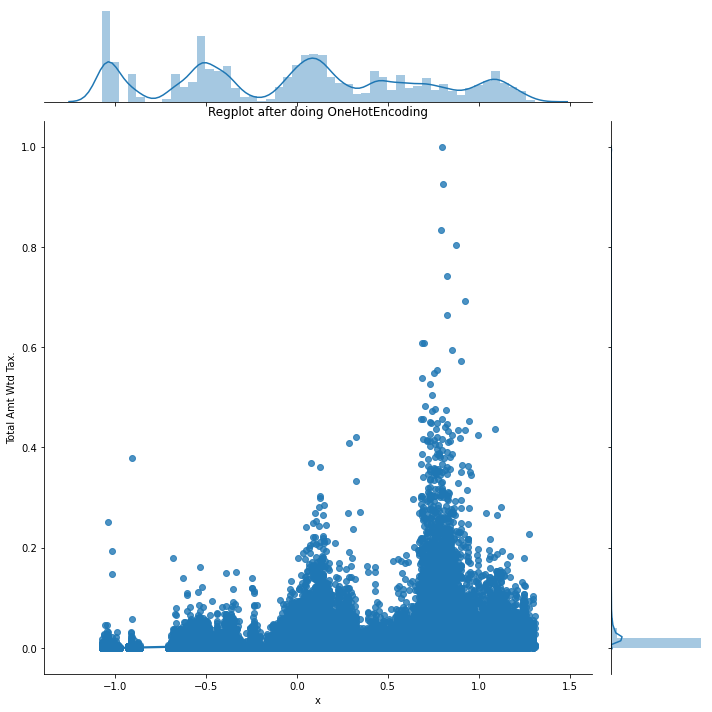

In [ ]:
sns.jointplot(x='x', y='Total Amt Wtd Tax.', data=scl_df, kind='reg', size=10)
plt.title('Regplot after doing OneHotEncoding')
plt.show()